# Implementations of Basic Image Filters

In this iPynb, we will explore and observe the differences between a few different filters and blurs, namely mean filtering and Gaussian smoothing.

In [1]:
import numpy as np

In [2]:
%matplotlib inline

import sys
import os
import matplotlib.pyplot as plt
import scipy.ndimage
import scipy
import imageio

In [3]:
import matplotlib.image as mpimg
from IPython.display import Image

## Displaying the images we will be working with

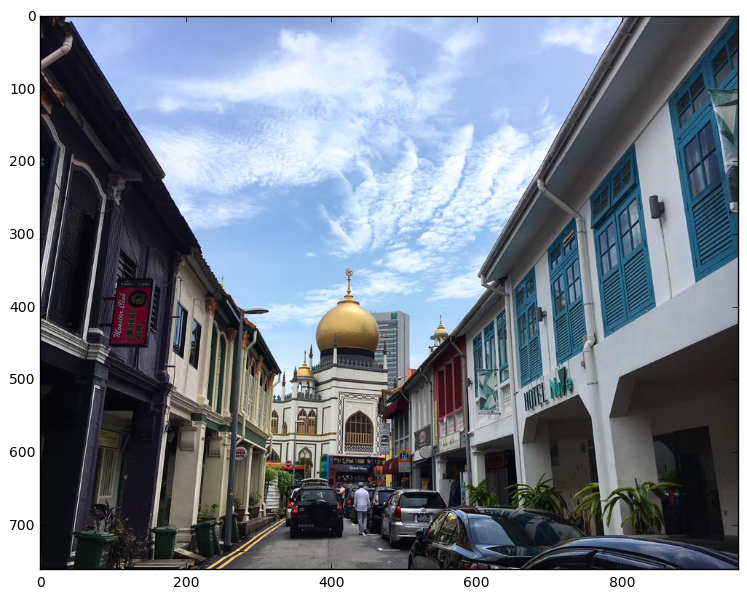

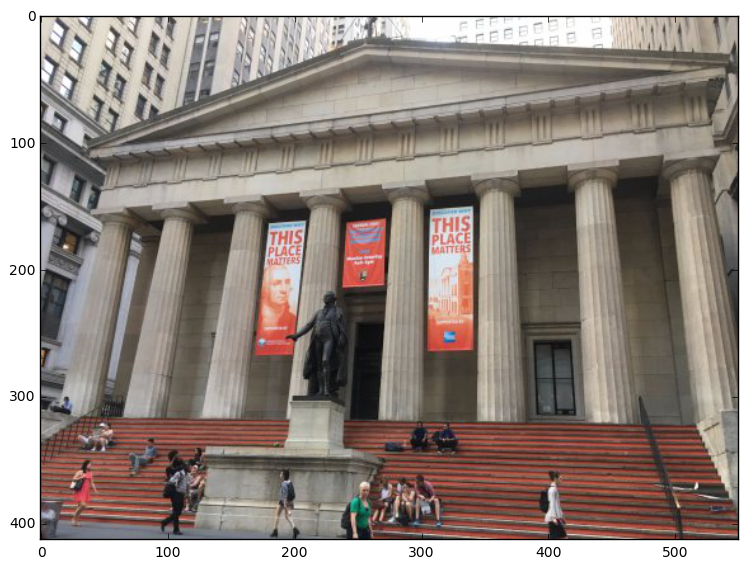

In [4]:
img1 = mpimg.imread('../img/singapore.jpg')   
img2 = mpimg.imread('../img/ny.jpg')     

fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1)
fig, ax2 = plt.subplots(figsize=(9, 9))
ax2.imshow(img2)
plt.show()

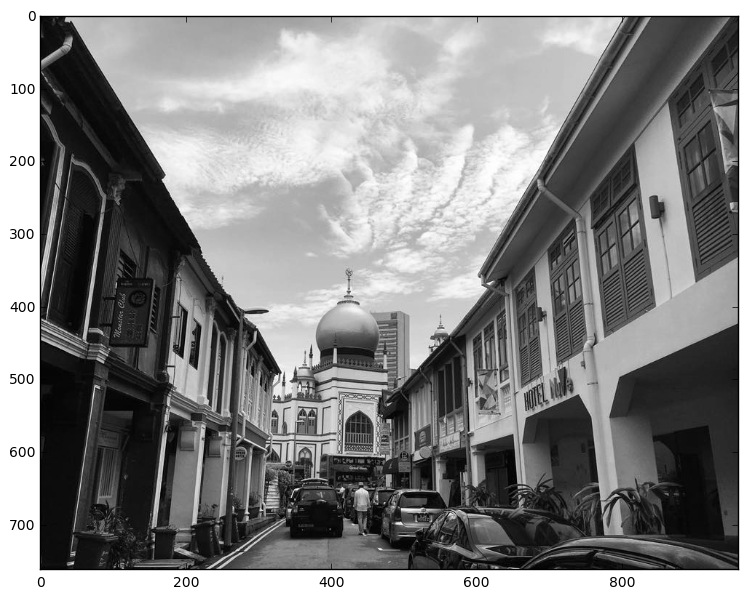

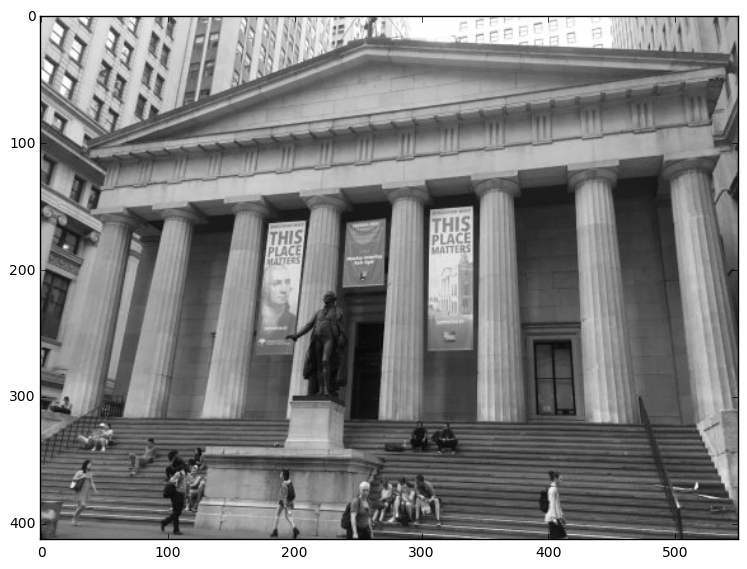

In [5]:
# Convert our images to grayscale for easier processing 
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

img1gray = rgb2gray(img1)
img2gray = rgb2gray(img2)

fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray, cmap = plt.get_cmap('gray'))
fig, ax2 = plt.subplots(figsize=(9, 9))
ax2.imshow(img2gray, cmap = plt.get_cmap('gray'))
plt.show()

## Defining our kernels

In [6]:
# Define the Gaussian kernel
def gaussKernel(sz =5,sigma=1):
    kernel = np.zeros((sz,sz))
    x = - sz // 2 + 1
    add = sz //2
    
    while x <= sz // 2:
        y = - sz // 2 + 1
        while y <= sz // 2:
            kernel[x + sz//2][y + sz//2] = np.exp(-(x**2 + y**2) / float(2 * sigma **2))
            y += 1
        x += 1
    kernel /= sum(sum(kernel))
    
    return kernel

In [7]:
#Define mean filter kernel
def meanFilt(sz = 3):
    x = np.ones((sz, sz))
    return x / sum(sum(x))

In [8]:
GK = gaussKernel()

In [9]:
AB = meanFilt()

# Black and White Examples
## Gaussian Smoothing v.s. Unfiltered image

In [10]:
img1gray_gaus = scipy.ndimage.convolve(img1gray,GK)

Original Image:


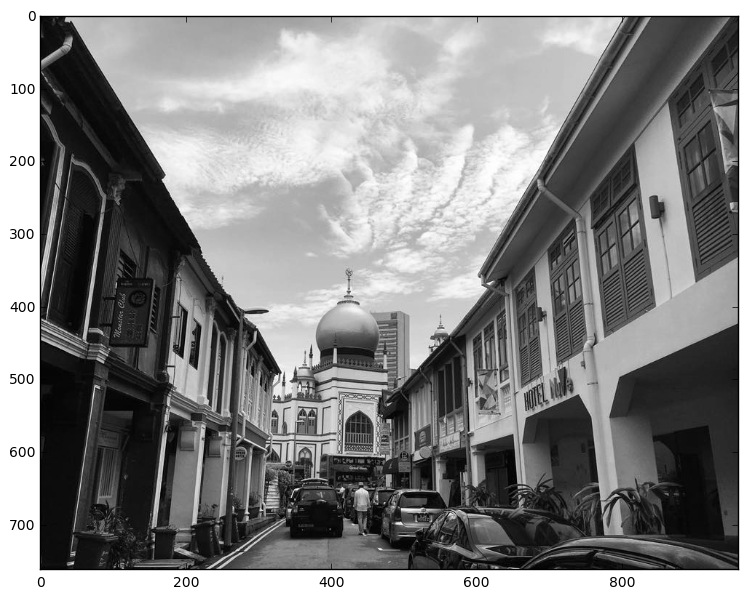

Gaussian Smoothed Image:


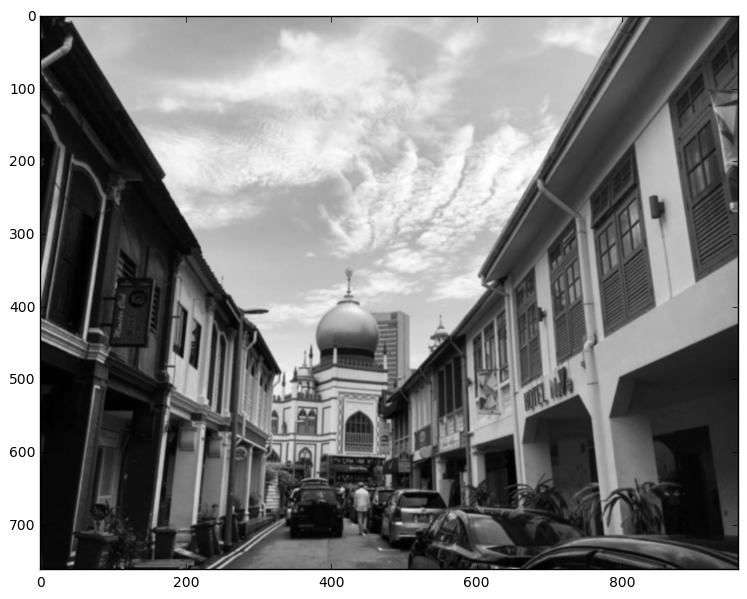

In [11]:
print("Original Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray, cmap = plt.get_cmap('gray'))
plt.show()
print("Gaussian Smoothed Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray_gaus, cmap = plt.get_cmap('gray'))
plt.show()

## Mean Filtering v.s. Unfiltered image

In [12]:
img1gray_mf = scipy.ndimage.convolve(img1gray,AB)

Original Image:


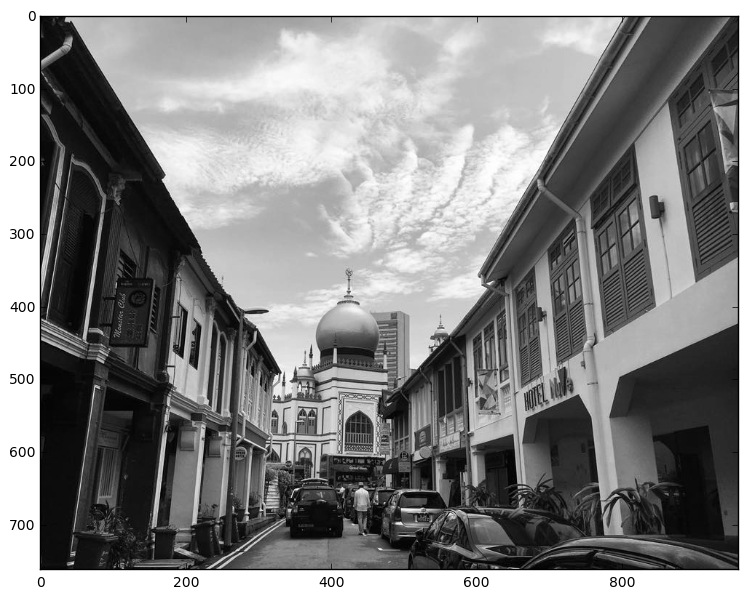

Mean Filtered Image:


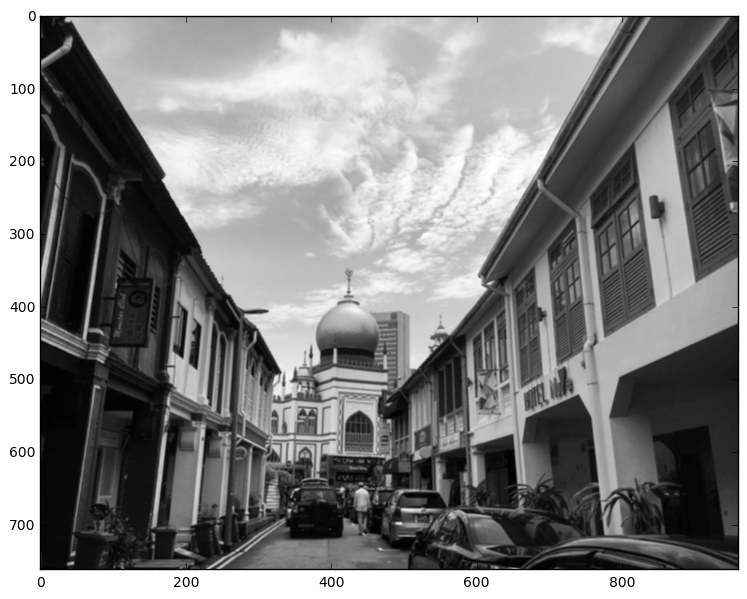

In [13]:
print("Original Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray, cmap = plt.get_cmap('gray'))
plt.show()
print("Mean Filtered Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray_mf, cmap = plt.get_cmap('gray'))
plt.show()

## Gaussian Smoothing v.s. Mean Filtering

Gaussian Smoothed Image:


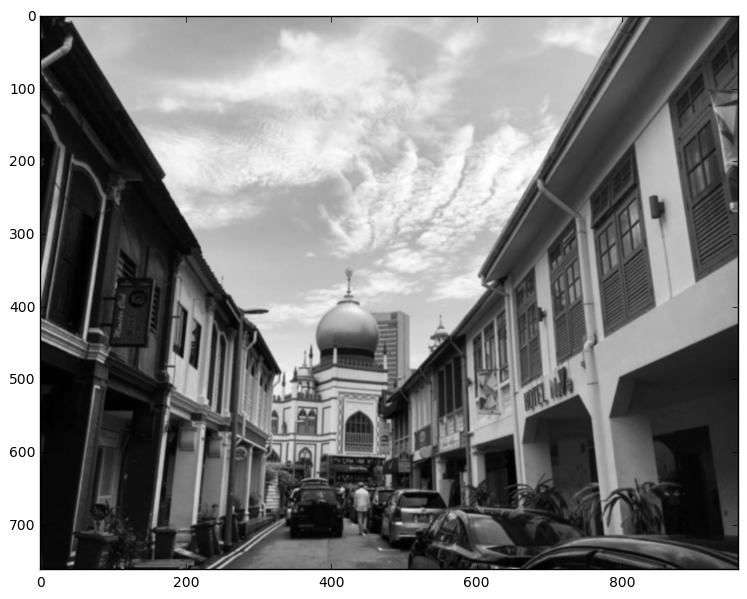

Mean Filtered Image:


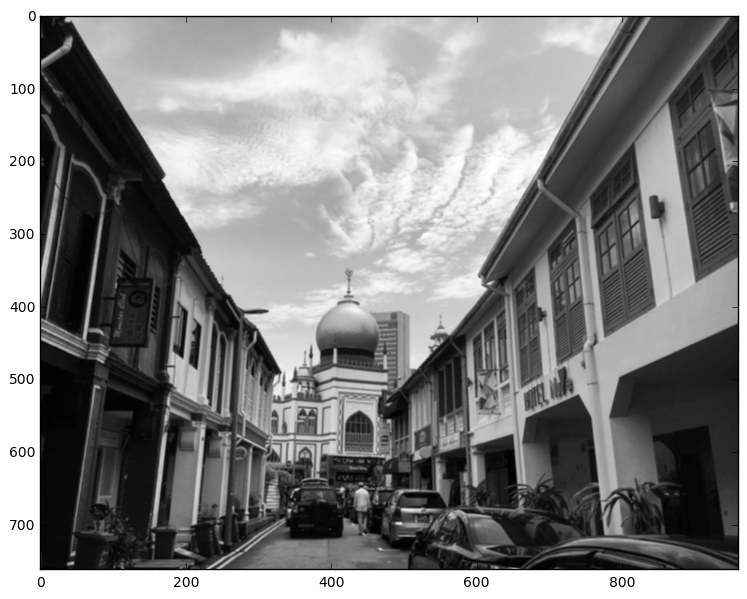

In [14]:
print("Gaussian Smoothed Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray_gaus, cmap = plt.get_cmap('gray'))
plt.show()
print("Mean Filtered Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img1gray_mf, cmap = plt.get_cmap('gray'))
plt.show()

As we can see from this small example, Gaussian smoothing does better at retaining edges, whereas mean filtering creates more of a traditional "blur" in an image!

# Color Examples
## Gaussian smoothing v.s. Unfiltered Image 

In [15]:
img2R_gaus = scipy.ndimage.convolve(img2[:, :, 0],GK)
img2G_gaus = scipy.ndimage.convolve(img2[:, :, 1],GK)
img2B_gaus = scipy.ndimage.convolve(img2[:, :, 2],GK)

In [16]:
img2_gaus = np.dstack((img2R_gaus, img2G_gaus, img2B_gaus))

Original Image:


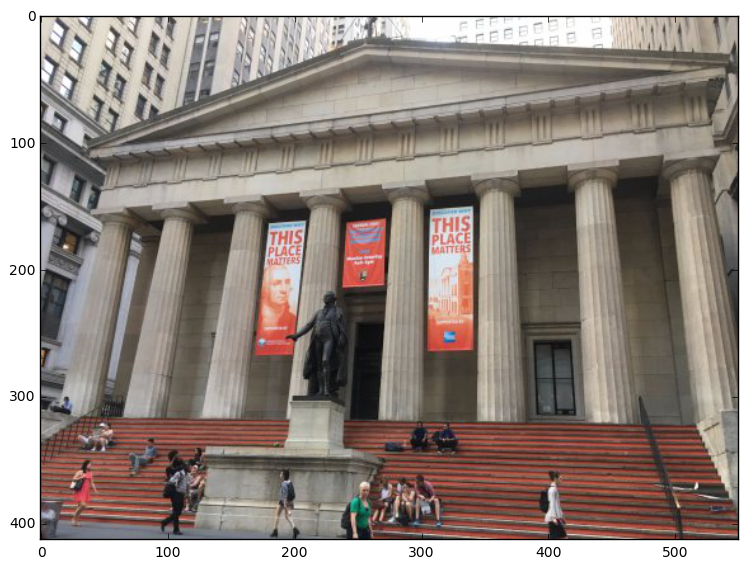

Gaussian Smoothed Image:


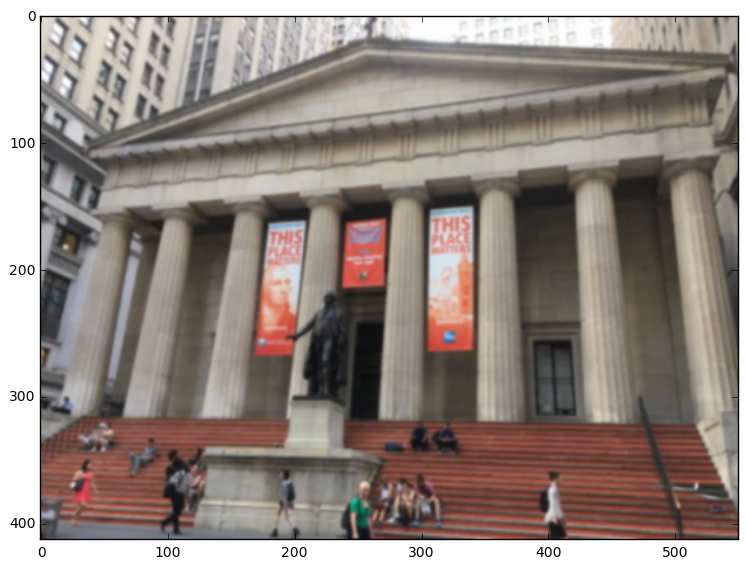

In [17]:
print("Original Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2)
plt.show()
print("Gaussian Smoothed Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2_gaus)
plt.show()

## Mean Filtering v.s. Unfiltered image

In [18]:
img2R_mf = scipy.ndimage.convolve(img2[:, :, 0],AB)
img2G_mf = scipy.ndimage.convolve(img2[:, :, 1],AB)
img2B_mf = scipy.ndimage.convolve(img2[:, :, 2],AB)

In [19]:
img2_mf = np.dstack((img2R_mf, img2G_mf, img2B_mf))

Original Image:


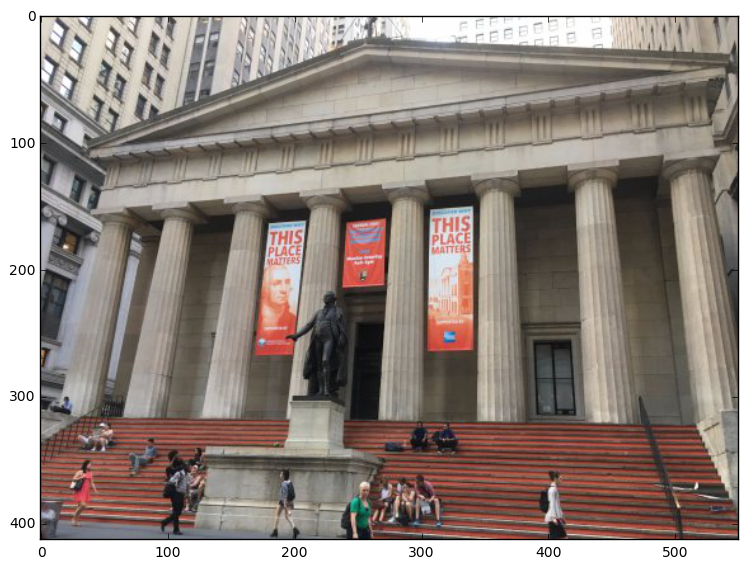

Mean Filtered Image:


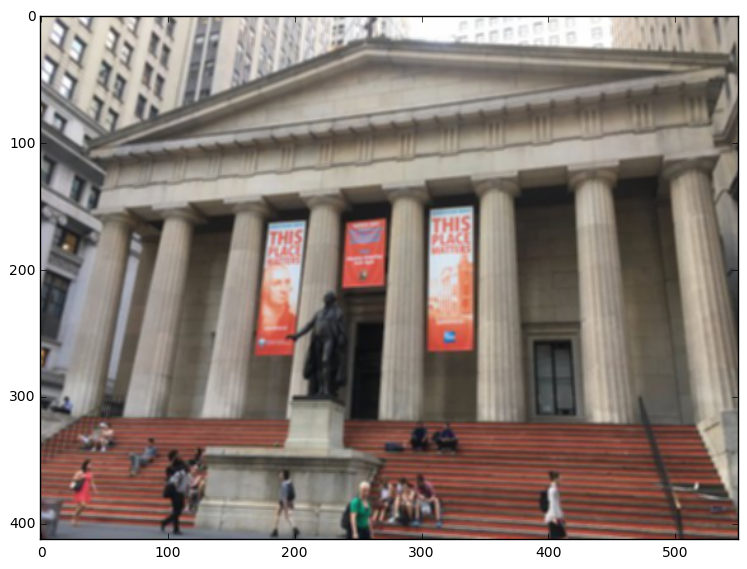

In [20]:
print("Original Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2)
plt.show()
print("Mean Filtered Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2_mf)
plt.show()

## Gaussian Smoothing v.s. Mean Filtering

Gaussian Smoothed Image:


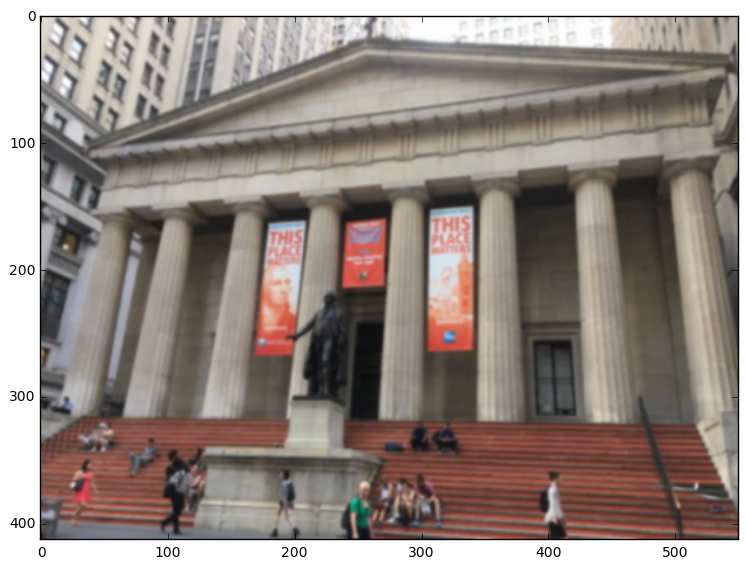

Mean Filtered Image:


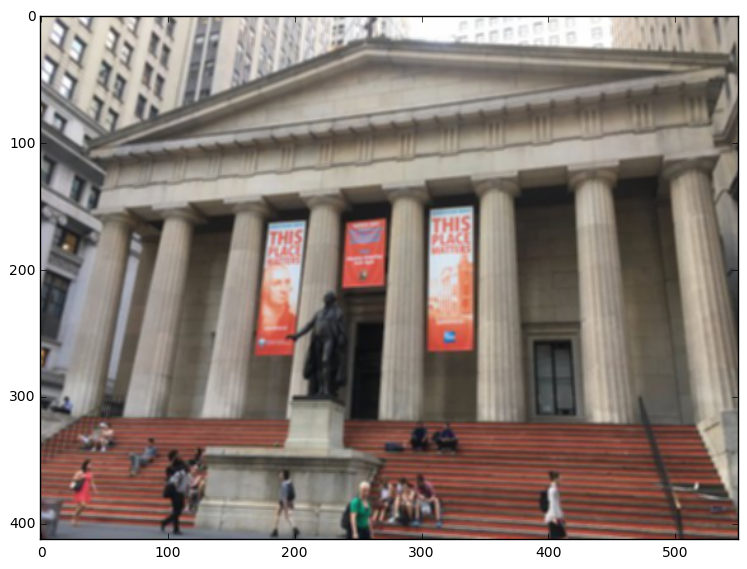

In [21]:
print("Gaussian Smoothed Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2_gaus)
plt.show()
print("Mean Filtered Image:")
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(img2_mf)
plt.show()

Again, a similar effect to what we saw in the previous example, where the mean filtered image looks more blurry than the Gaussian smoothed one. 

This brings up an interesting question, though: how much must we filter an image to make any changes clear to the naked eye? How do the parameters of our kernels (size and, for the Gaussian, standard deviation) affect what we see? Let's check it out.

# Gaussian Smoothing: Evaluating Parameters
## Kernel size

In the below code, I display our original image while varying the kernel size of our Gaussian smoothing.

Gaussian kernel size:  3


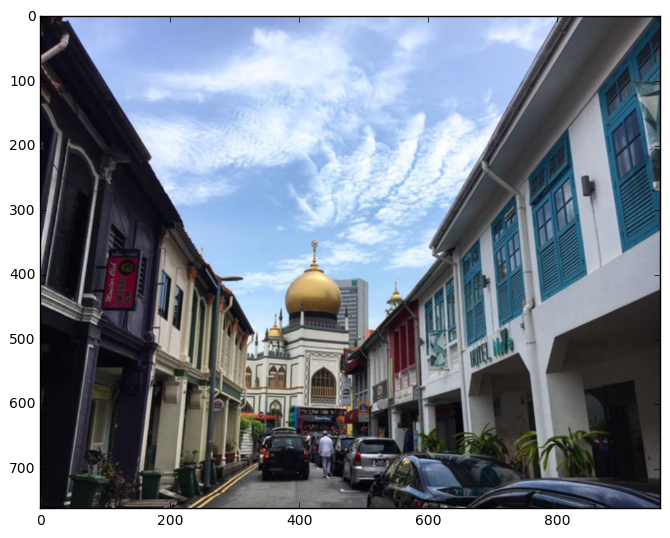

Gaussian kernel size:  11


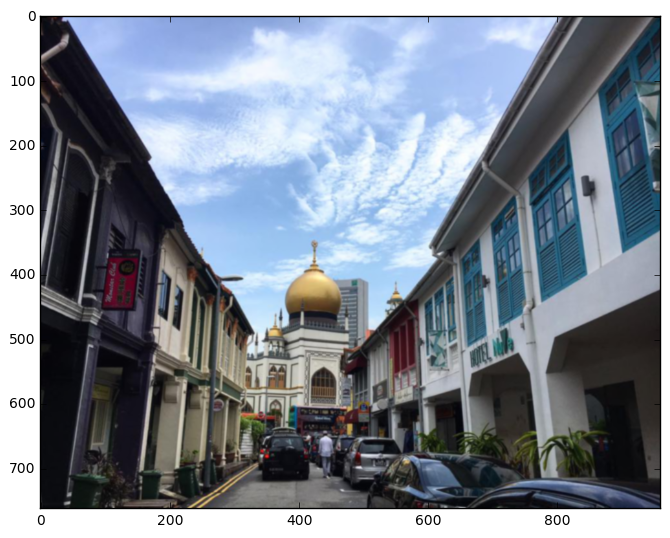

Gaussian kernel size:  19


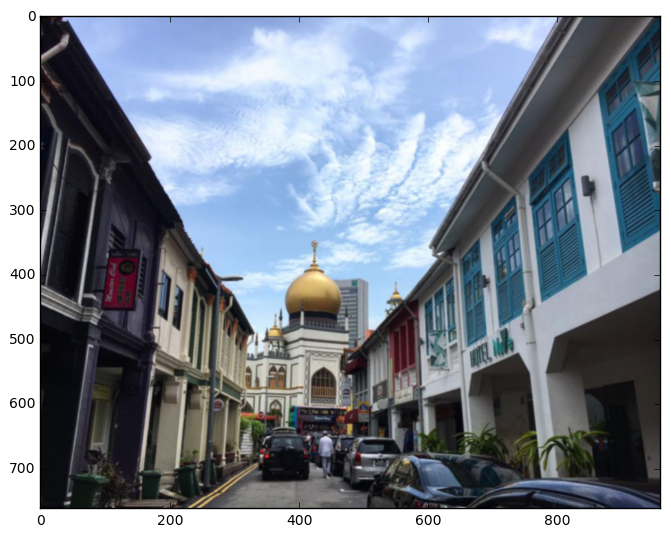

Gaussian kernel size:  27


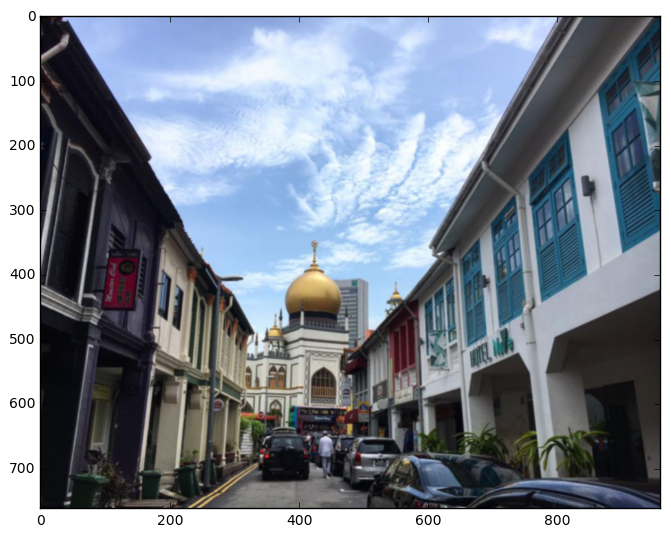

Gaussian kernel size:  35


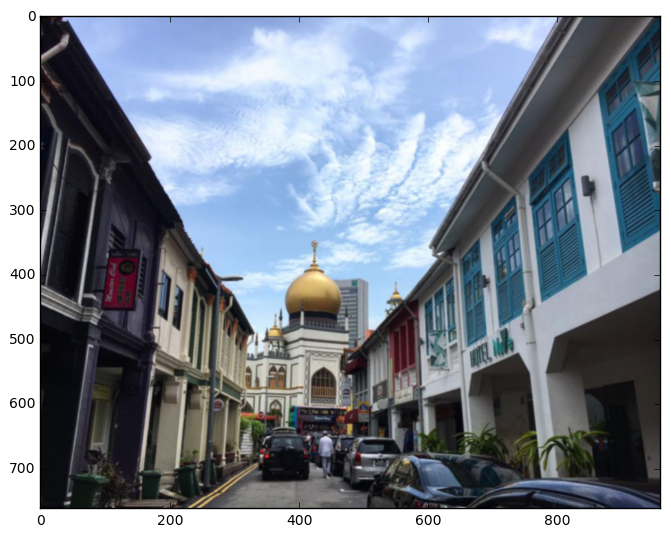

In [22]:
num_plots = 5
boost = 2

for i in range(num_plots):
    GK = gaussKernel(sz = 8*i + 1 + boost)
    img1R_plot = scipy.ndimage.convolve(img1[:, :, 0],GK)
    img1G_plot = scipy.ndimage.convolve(img1[:, :, 1],GK)
    img1B_plot = scipy.ndimage.convolve(img1[:, :, 2],GK)
    img1_plot = np.dstack((img1R_plot, img1G_plot, img1B_plot))
    print("Gaussian kernel size: ", 8*i + 1 + boost)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img1_plot)
    plt.show()


As you can see, increasing kernel size does make some small changes to the output. However, doing a matrix convolution with larger kernels is much more computationally expensive, so oftentimes it isn't worth it to go too high. 

## Kernel Standard Deviation

Gaussian kernel standard deviation:  1


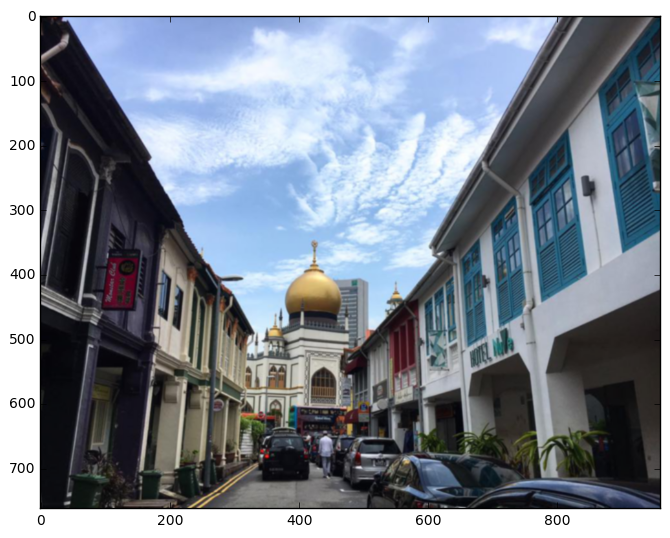

Gaussian kernel standard deviation:  5


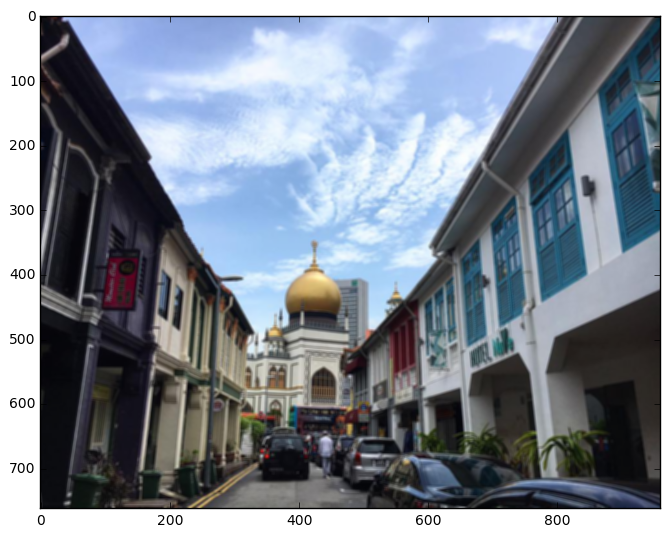

Gaussian kernel standard deviation:  9


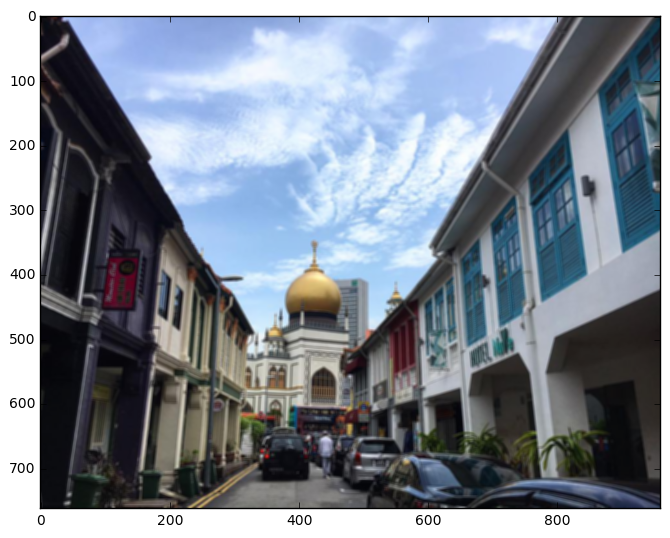

Gaussian kernel standard deviation:  13


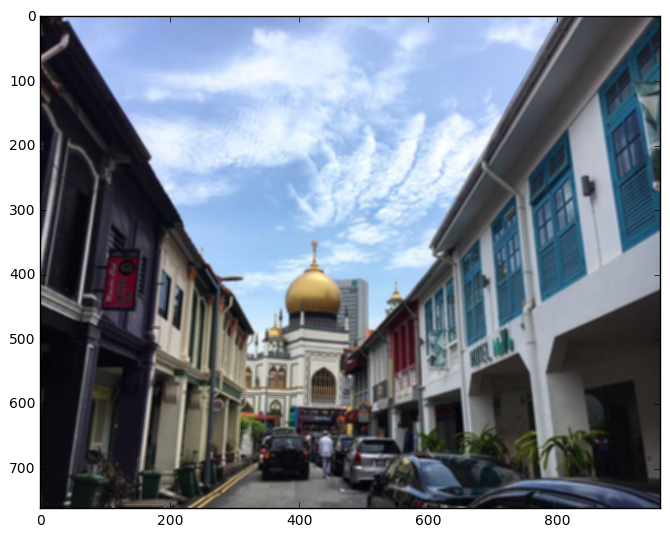

Gaussian kernel standard deviation:  17


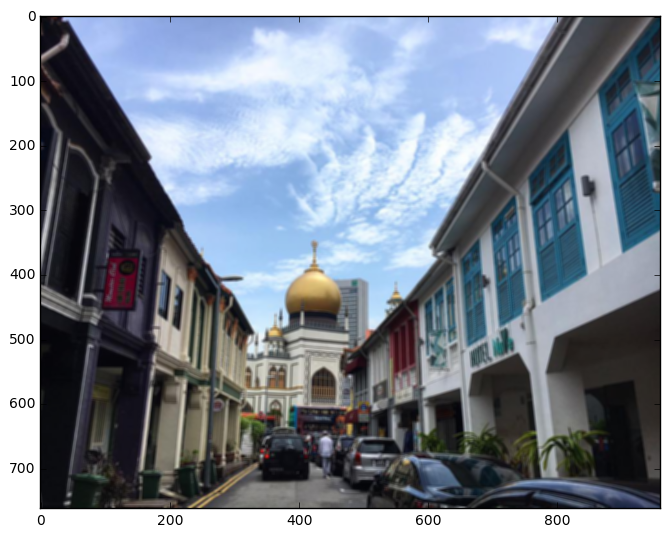

In [23]:
num_plots = 5


for i in range(num_plots):
    GK = gaussKernel(sigma = 1 + 4*i)
    img1R_plot = scipy.ndimage.convolve(img1[:, :, 0],GK)
    img1G_plot = scipy.ndimage.convolve(img1[:, :, 1],GK)
    img1B_plot = scipy.ndimage.convolve(img1[:, :, 2],GK)
    img1_plot = np.dstack((img1R_plot, img1G_plot, img1B_plot))
    print("Gaussian kernel standard deviation: ", 4*i + 1)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img1_plot)
    plt.show()


As the standard deviation increases, our smoothing looks more and more like a mean filter. This could be risky because we could be losing valuable edges if our standard deviation is too high. However, if our standard deviation is too low, we aren't really filtering much.

# Mean Filter: Evaluating Parameters
## Kernel Size

Mean filter kernel size:  3


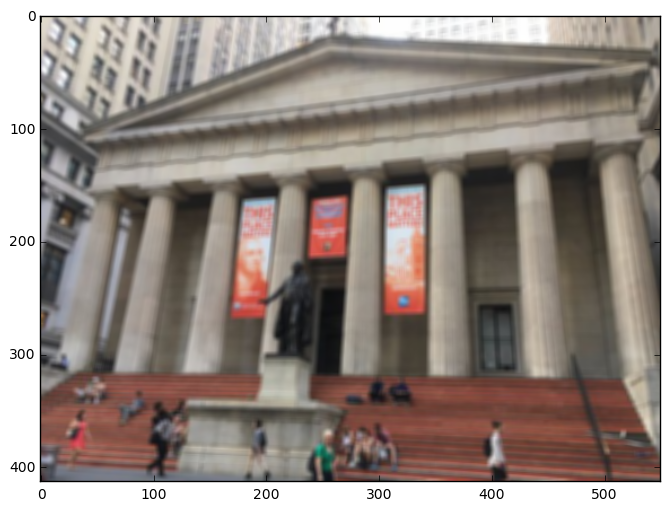

Mean filter kernel size:  11


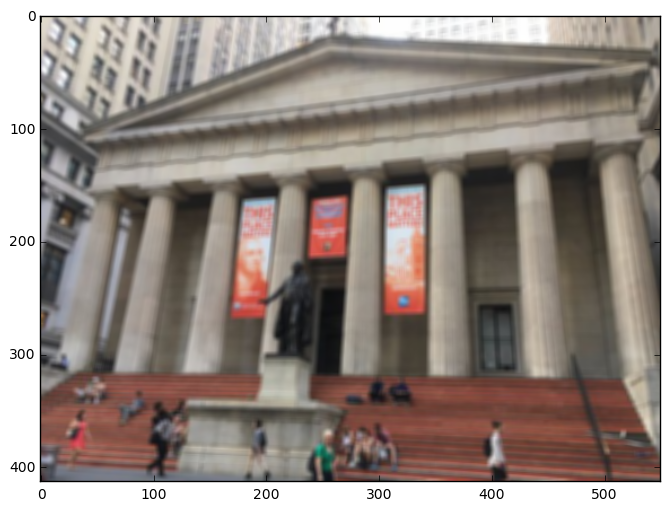

Mean filter kernel size:  19


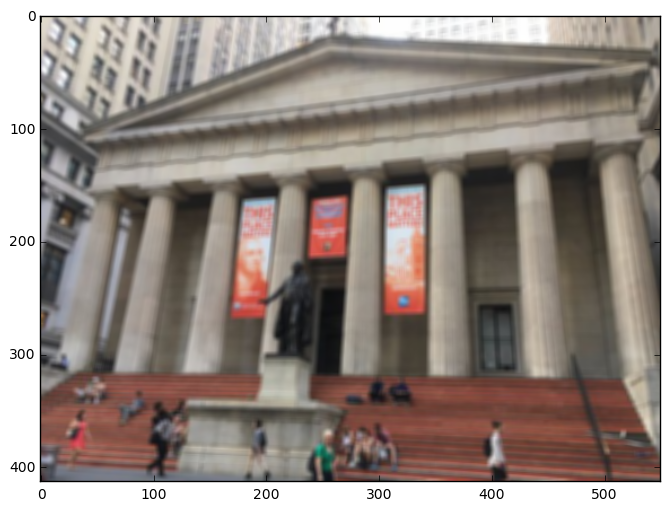

Mean filter kernel size:  27


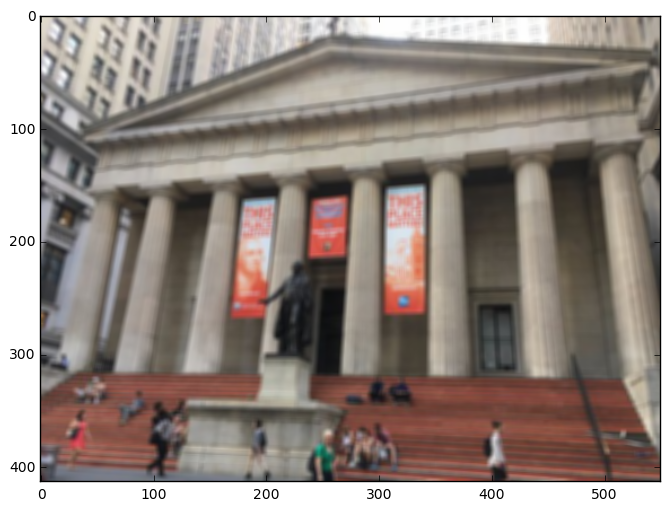

Mean filter kernel size:  35


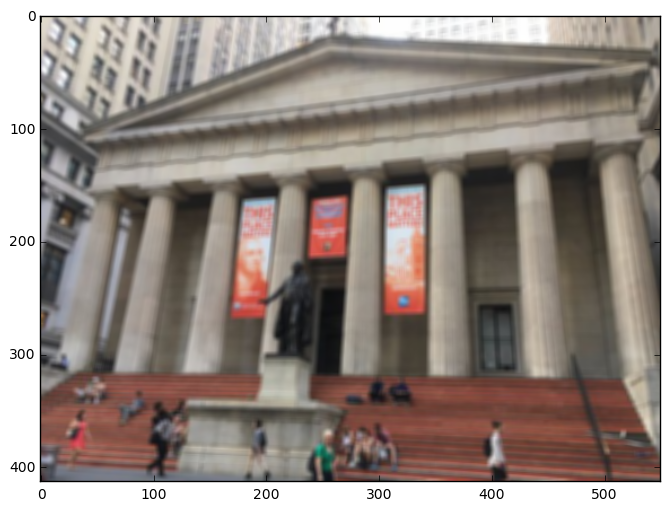

In [24]:
num_plots = 5
boost = 2

for i in range(num_plots):
    AB = meanFilt(sz = 8*i + 1 + boost)
    img2R_plot = scipy.ndimage.convolve(img2[:, :, 0],GK)
    img2G_plot = scipy.ndimage.convolve(img2[:, :, 1],GK)
    img2B_plot = scipy.ndimage.convolve(img2[:, :, 2],GK)
    img2_plot = np.dstack((img2R_plot, img2G_plot, img2B_plot))
    print("Mean filter kernel size: ", 8*i + 1 + boost)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img2_plot)
    plt.show()

After a point, it doesn't seem as though mean filter kernel size really makes much of a difference, except that it makes computation more expensive. Sad!